In [1]:
import torch
import matplotlib.pyplot as plt
from torch import optim, distributions, nn
from tqdm.notebook import tqdm
import gpzoo
from gpzoo.kernels import NSF_RBF, batched_RBF, batched_MGGP_RBF
from gpzoo.gp import GaussianPrior, SVGP, VNNGP, MGGP_WSVGP
from gpzoo.likelihoods import PNMF, NSF2, Hybrid_NSF2, Hybrid_NSF_Exact
from gpzoo.utilities import whitened_KL, train_hybrid, train_hybrid_batched, anndata_to_train_val, plot_factors, rescale_spatial_coords, add_jitter, init_softplus
import squidpy as sq
import numpy as np
from sklearn.decomposition import NMF
import scanpy as sc
import random

from gpzoo.utilities import regularized_nmf, dims_autocorr
from matplotlib.animation import FuncAnimation
from matplotlib import animation
import pickle
from sklearn.cluster import KMeans

import matplotlib.patheffects as path_effects


/gladstone/engelhardt/home/lchumpitaz/gitclones/GPzoo/gpzoo/utilities.py:2: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
def plot_factors(factors, X, moran_idx=None, ax=None, size=7, alpha=0.8, s=0.1, names=None):

    max_val = np.percentile(factors, 99)
    min_val = np.percentile(factors, 1)

    
    if moran_idx is not None:
        factors = factors[moran_idx]
        if names is not None:
            names = names[moran_idx]

    L = len(factors)

    if ax is None:
        fig, ax = plt.subplots(2, 6, figsize=(size*6, size*2), tight_layout=True)
        
    for i in range(L):
        
        
        curr_ax = ax[i//6, i%6]
        
        
        
        curr_ax.scatter(X[:, 0], X[:,1], c=factors[i], vmin=min_val, vmax=max_val, alpha=alpha, cmap='turbo', s=s)

        curr_ax.invert_yaxis()
        if names is not None:
            curr_ax.set_title(names[i], x=0.03, y=.88, fontsize="small", c="white",
                     ha="left", va="top")
            
        curr_ax.set_xticks([])
        curr_ax.set_yticks([])
        curr_ax.set_facecolor('xkcd:gray')

In [3]:
adata = sq.datasets.slideseqv2()
adata = adata.raw.to_adata()

/gladstone/engelhardt/home/lchumpitaz/miniconda3/envs/gpzoo/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/gladstone/engelhardt/home/lchumpitaz/miniconda3/envs/gpzoo/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


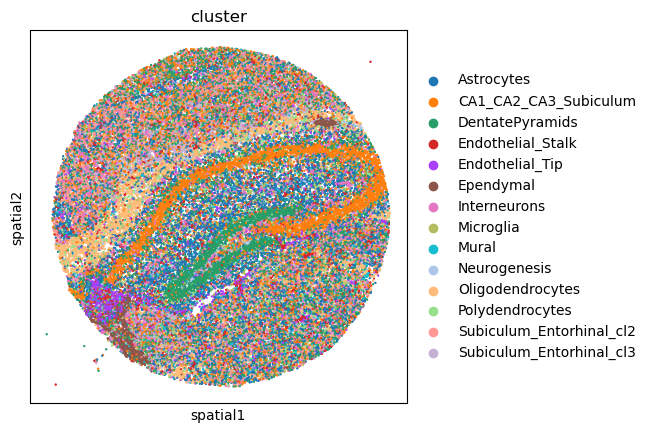

In [4]:
sq.pl.spatial_scatter(adata, color="cluster", size=1, shape=None);


<Axes: >

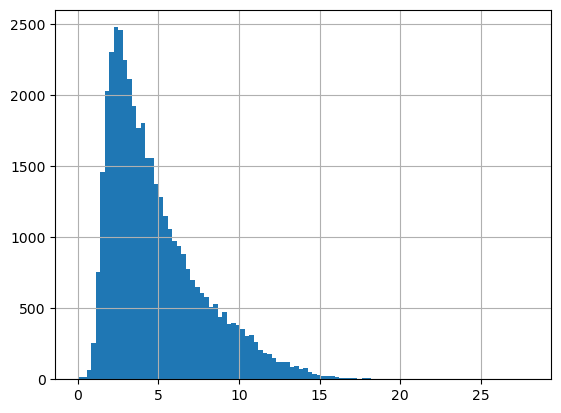

In [5]:
adata.var["mt"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)
adata.obs.pct_counts_mt.hist(bins=100)


In [6]:
adata = adata[adata.obs.pct_counts_mt < 20] #from 53K to 45K
sc.pp.filter_cells(adata, min_counts=100)
sc.pp.filter_genes(adata, min_cells=10)

/gladstone/engelhardt/home/lchumpitaz/miniconda3/envs/gpzoo/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:158: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_counts"] = number


In [7]:
device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=1)

In [8]:
Dtr, Dval = anndata_to_train_val(adata, sz="scanpy")

In [9]:
Y = Dtr['Y'].T
Y = Y[~adata.var.MT]
X = Dtr['X']*50
V = Dtr['sz']

In [10]:
Y.shape

(17702, 39694)

In [11]:
# nmf_model = NMF(n_components=24, max_iter=20, init='random', random_state=620, alpha_H=2e-1, alpha_W=1e-7)
nmf_model = NMF(n_components=24, max_iter=10, init='random', random_state=0, alpha_H=2e-1, alpha_W=1e-7)

In [12]:
nmf_model.fit(Y.T/V)

/gladstone/engelhardt/home/lchumpitaz/miniconda3/envs/gpzoo/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1710: ConvergenceWarning: Maximum number of iterations 10 reached. Increase it to improve convergence.
  warnings.warn(


NMF(alpha_H=0.2, alpha_W=1e-07, init='random', max_iter=10, n_components=24,
    random_state=0)

In [13]:
exp_factors = nmf_model.transform(Y.T/V)/5
factors = np.log(exp_factors + 1e-2)
loadings = nmf_model.components_.T*5

/gladstone/engelhardt/home/lchumpitaz/miniconda3/envs/gpzoo/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1710: ConvergenceWarning: Maximum number of iterations 10 reached. Increase it to improve convergence.
  warnings.warn(


In [20]:
moran_idx, moranI = dims_autocorr(np.exp(factors), X)

here_andata


In [21]:
moranI

array([ 7.46049116e-01,  6.11633372e-01,  6.07580159e-01,  5.98045171e-01,
        5.78888658e-01,  4.69343606e-01,  4.64017108e-01,  3.69318341e-01,
        3.62899691e-01,  2.43566487e-01,  2.43259565e-01,  2.19991738e-01,
        2.12479659e-01,  2.11583987e-01,  1.83950209e-01,  1.73642269e-01,
        1.39685202e-01,  1.35717209e-01,  9.58081260e-02,  3.64839439e-03,
        1.52738284e-03, -3.51472426e-04, -1.15155007e-03, -5.44194776e-03])

In [22]:
factors_ordered=factors[:, moran_idx]
loadings_ordered=loadings[:, moran_idx]

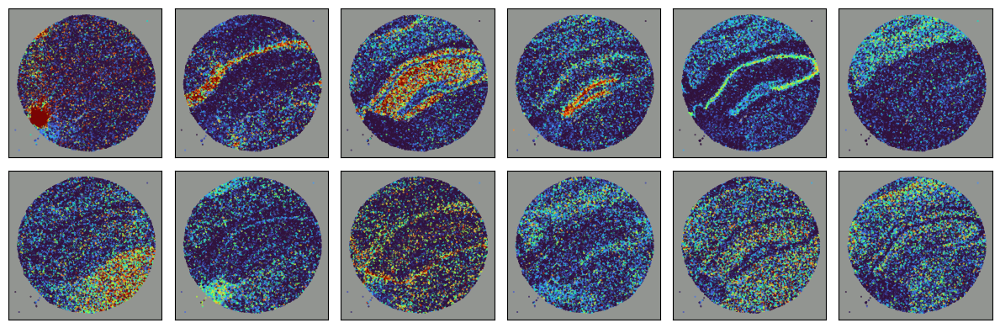

In [25]:
plot_factors(np.exp(factors_ordered.T)[:12], X, moran_idx=None, ax=None, size=2, s=0.2, alpha=0.9)
# plt.savefig('slideseq_nmf_init.svg')

In [19]:
# # zero out repeated factors
# factors_ordered[:,5]=np.random.randn(*factors_ordered[:,5].shape)
# factors_ordered[:,8]=np.random.randn(*factors_ordered[:,8].shape)
# factors_ordered[:,9]=np.random.randn(*factors_ordered[:,9].shape)
# factors_ordered[:,12]=np.random.randn(*factors_ordered[:,9].shape)
# factors_ordered[:,15]=np.random.randn(*factors_ordered[:,9].shape)




# loadings_ordered[:,5][::1]=0.0
# loadings_ordered[:,8][::1]=0.0
# loadings_ordered[:,9][::1]=0.0
# loadings_ordered[:,12][::1]=0.0
# loadings_ordered[:,15][::1]=0.0



# factors=factors_ordered
# loadings=loadings_ordered

In [26]:
X = torch.tensor(X).type(torch.float)
Y = torch.tensor(Y).type(torch.float)
groupsX = torch.tensor(adata[Dtr['idx']].obs.cluster.values.codes).type(torch.LongTensor)
n_groups = len(adata.obs.cluster.values.categories)

<BarContainer object of 14 artists>

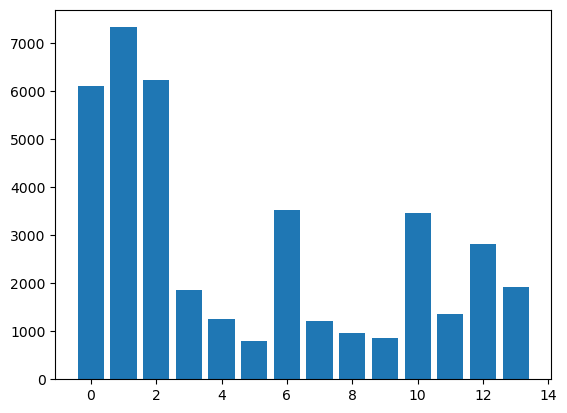

In [27]:
plt.bar(*torch.unique(groupsX, return_counts=True))

In [28]:
def build_model(Y, M=215, L=10):
    

    torch.manual_seed(0)



    groupsX = torch.tensor(adata[Dtr['idx']].obs.cluster.values.codes).type(torch.LongTensor)
    n_groups = len(adata.obs.cluster.values.categories)

    scale = len(groupsX)/M

    Z = []
    groupsZ = []
    for i in range(n_groups):
        mask = groupsX==i
    
        number_clusters = (int(sum(mask)/scale))
        kmeans = KMeans(n_clusters=number_clusters, random_state=240, n_init="auto").fit(X[mask])
        Z.append(kmeans.cluster_centers_)
        groupsZ += number_clusters*[i]
    Z = np.concatenate(Z)

    
    Z = nn.Parameter(torch.tensor(Z).type(torch.float), requires_grad=False)
    groupsZ = nn.Parameter(torch.tensor(groupsZ).type(torch.LongTensor), requires_grad=False)

    M = len(Z) #new M which should be close to original M

    
    
    kernel = batched_MGGP_RBF(sigma=[1.0]*L, lengthscale=[2.0]*L, group_diff_param=[100.0]*L, n_groups=n_groups)

    gp = MGGP_WSVGP(kernel, M=M, n_groups=n_groups, jitter=1e-5)

    
    Kzx = kernel.forward(Z, X, groupsZ, groupsX).contiguous()
    Kxz = torch.transpose(Kzx, -2, -1)
    Kzz = kernel.forward(Z, Z, groupsZ, groupsZ).contiguous()

    Lzz = torch.linalg.cholesky(add_jitter(Kzz, 1e-5))
    Lzzt = torch.transpose(Lzz, -2, -1)

        


    

    all_factors = torch.tensor(factors_ordered.T)[:L, :, None].type(torch.float)
    L1 = torch.linalg.cholesky(add_jitter(Kzx@Kxz, 1e-3))
    

    solved1 = torch.cholesky_solve(Kzx@all_factors, L1)
    print('solved1 shape:', solved1.shape)
    
    
    mu = Lzzt@solved1

    print('here')
    
    
    # gp.mu = nn.Parameter(torch.randn((L, M)).type(torch.float))
    
    gp.mu = nn.Parameter(torch.squeeze(mu).clone().detach()).type(torch.float)



    # # get values for Lu (whitened)
    # Wt = torch.linalg.solve_triangular(Lzz, Kzx, upper=False)
    # W = torch.transpose(Wt, -2, -1)
    # outers = torch.vmap(torch.vmap(lambda x:torch.outer(x, x).view(-1)))(W)
    # outers_matmul = torch.transpose(outers, -2, -1) @ outers
    
    # outers_chol = torch.cholesky(add_jitter(outers_matmul, 1e-5))
    
    # outers_solv = torch.cholesky_solve(torch.transpose(outers, -1, -2), outers_chol)



    
    # all_factors_exp = all_factors.exp()
    # all_factors_exp = all_factors_exp/all_factors_exp.amax(dim=1, keepdim=True)

    
    
    # S = torch.squeeze(outers_solv @ (1-all_factors_exp))

    # S = torch.vmap(lambda x: x.reshape(M, M))(S)

    # Lu = torch.cholesky(add_jitter(S, 1e-5))


    
    
    Lu = 1e-2*torch.eye(M).expand(L, M, M)
    gp.Lu = nn.Parameter(Lu.clone().detach())
    
    gp.Z = Z
    gp.groupsZ = groupsZ

    prior = GaussianPrior(Y, L=L)
    prior.mean = nn.Parameter(torch.squeeze(torch.tensor(factors_ordered[:, L:].T)).clone().detach().type(torch.float))

    

    model = Hybrid_NSF2(gp, prior, Y, L=L, T=L)


    model.sf.W = nn.Parameter(torch.tensor(init_softplus(loadings_ordered)[:, :L]).type(torch.float)) 
    model.cf.W = nn.Parameter(torch.tensor(init_softplus(loadings_ordered)[:, L:]).type(torch.float)) 


    model.V = nn.Parameter(torch.squeeze(torch.tensor(init_softplus(V)).type(torch.float))) 
    
    # model.to(device)
    return model

In [29]:
# def build_model_scratch(Y, M=215, L=10):
    

#     torch.manual_seed(0)


#     groupsX = torch.tensor(adata[Dtr['idx']].obs.cluster.values.codes).type(torch.LongTensor)
#     n_groups = len(adata.obs.cluster.values.categories)

#     idx = torch.multinomial(torch.ones(X.shape[0]), num_samples=M*n_groups, replacement=False)

    
#     Z = nn.Parameter(X[idx]).type(torch.float)
#     groupsZ = nn.Parameter(groupsX[idx].type(torch.LongTensor), requires_grad=False)

    
    
#     kernel = batched_MGGP_RBF(sigma=[1.0]*L, lengthscale=[2.0]*L, group_diff_param=[1.0]*L, n_groups=n_groups)

#     gp = MGGP_SVGP(kernel, M=M, n_groups=n_groups, jitter=1e-2)

    
 
#     gp.mu = nn.Parameter(torch.randn((L, M*n_groups)).type(torch.float))    
#     Lu = 1e-2*torch.eye(M*n_groups).expand(L, M*n_groups, M*n_groups)
#     gp.Lu = nn.Parameter(Lu.clone().detach())
    
#     gp.Z = nn.Parameter(Z, requires_grad=False)
#     gp.groupsZ = groupsZ

#     prior = GaussianPrior(Y, L=L)
#     model = Hybrid_NSF2(gp, prior, Y, L=L, T=L)
    
#     model.to(device)
#     return model

In [30]:
model = build_model(Y, L=12, M=3000)

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f1b4e342040>
Traceback (most recent call last):
  File "/gladstone/engelhardt/home/lchumpitaz/miniconda3/envs/gpzoo/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/gladstone/engelhardt/home/lchumpitaz/miniconda3/envs/gpzoo/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/gladstone/engelhardt/home/lchumpitaz/miniconda3/envs/gpzoo/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/gladstone/engelhardt/home/lchumpitaz/miniconda3/envs/gpzoo/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has n

solved1 shape: torch.Size([12, 2992, 1])
here


In [31]:
Z = model.sf.prior.Z
groupsZ = model.sf.prior.groupsZ
kernel = model.sf.prior.kernel

Kzx = kernel.forward(Z, X, groupsZ, groupsX).contiguous()
Kxz = torch.transpose(Kzx, -2, -1)
Kzz = kernel.forward(Z, Z, groupsZ, groupsZ).contiguous()

Lzz = torch.linalg.cholesky(add_jitter(Kzz, 1e-5))
Wt = torch.linalg.solve_triangular(Lzz, Kzx, upper=False)
W = torch.transpose(Wt, -2, -1).detach()

In [32]:
all_factors = torch.tensor(factors_ordered.T)[:12, :].type(torch.float)
all_factors_exp = all_factors.exp()
all_factors_exp = all_factors_exp/all_factors_exp.amax(dim=1, keepdim=True)

In [91]:
goal = 1.5*(1- all_factors_exp) + torch.sum(W**2, dim=-1)-1 
goal = torch.clamp(goal, min=0.0)

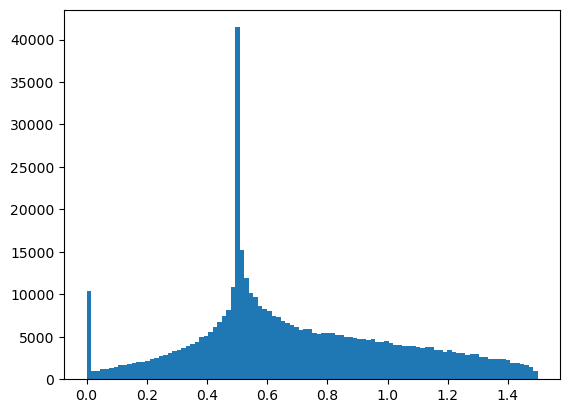

In [92]:
plt.hist(goal.view(-1), bins=100);

In [93]:
lstsq_solved = torch.linalg.lstsq(W**2, goal[:, :, None])

In [94]:
lstsq_solved.solution.min()

tensor(6.8672e-05)

In [37]:
#we precompute W, in case we dont want to train kernel parameters
Z = model.sf.prior.Z
groupsZ = model.sf.prior.groupsZ
groupsX = torch.tensor(adata[Dtr['idx']].obs.cluster.values.codes).type(torch.LongTensor)

kernel = model.sf.prior.kernel

Kzx = kernel.forward(Z, X, groupsZ, groupsX).contiguous()
Kxz = torch.transpose(Kzx, -2, -1)
Kzz = kernel.forward(Z, Z, groupsZ, groupsZ).contiguous()

Lzz = torch.linalg.cholesky(add_jitter(Kzz, 1e-5))
Wt = torch.linalg.solve_triangular(Lzz, Kzx, upper=False)
W = torch.transpose(Wt, -2, -1).detach()

In [95]:
model.sf.prior.Lu = nn.Parameter(torch.diag_embed(torch.log(lstsq_solved.solution.squeeze()**0.5)).detach().cpu().clone())

In [96]:
model.cpu()


qF, _, _ = model.sf.prior.forward_precomputed(W)

mean = torch.exp(qF.mean).detach().numpy()
scale = qF.scale.detach().numpy()

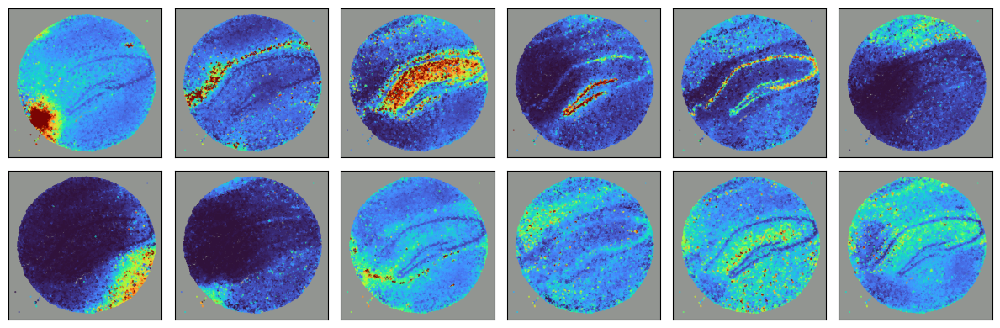

In [97]:
plot_factors(mean, X, moran_idx=None, ax=None, size=2, s=0.2, alpha=0.9)
# plt.savefig('slideseq_nsf_init.svg')

In [98]:
# plot_factors(mean, X, moran_idx=None, ax=None, size=2, s=0.2, alpha=0.9)
# plt.savefig('slideseq_nsf_converged.svg')

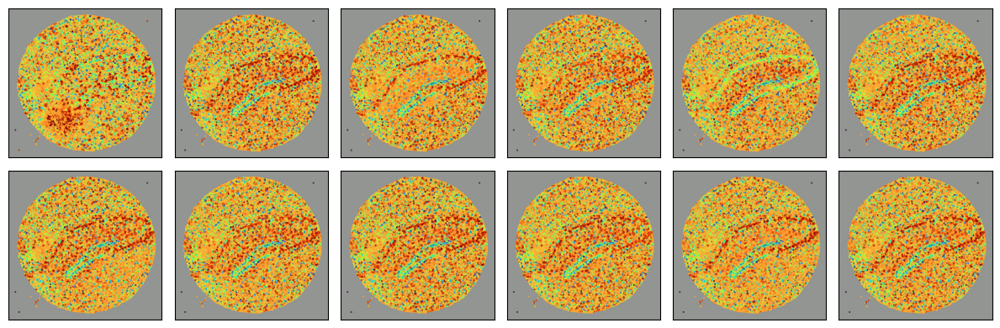

In [99]:
plot_factors(scale, X, moran_idx=None, ax=None, size=2, s=0.2, alpha=0.9)

In [100]:
scale.min()

0.0099247405

In [44]:
loadings_sf = torch.nn.functional.softplus(model.sf.W).detach().cpu()
loadings_cf = torch.nn.functional.softplus(model.cf.W).detach().cpu()

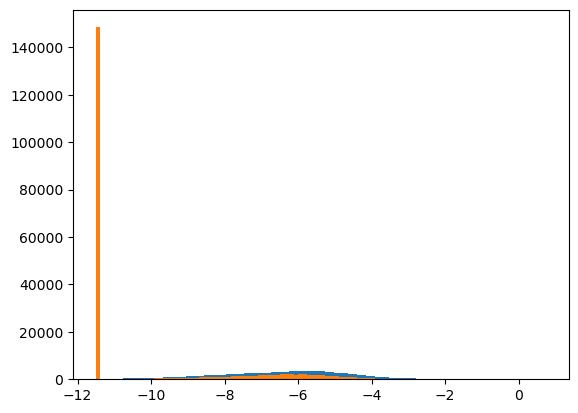

In [45]:
plt.hist(torch.log(loadings_sf.view(-1)), bins=100);
plt.hist(torch.log(loadings_cf.view(-1)), bins=100);

In [46]:
X_train = X.to(device)
Y_train = Y.to(device)
groupsX_train = groupsX.to(device)

In [101]:
def model_grads(model):
    model.sf.prior.kernel.sigma.requires_grad = False
    model.sf.prior.kernel.lengthscale.requires_grad = False
    model.sf.prior.kernel.group_diff_param.requires_grad = False
    model.sf.prior.Z.requires_grad=False
    model.sf.prior.mu.requires_grad=True
    model.sf.prior.Lu.requires_grad=True
    model.sf.W.requires_grad=False

    model.cf.prior.mean.requires_grad=False
    model.cf.prior.scale.requires_grad=True
    model.cf.W.requires_grad=False

    model.cf.prior.scale_pf = 0.5
    
    
    model.V.requires_grad=False

In [102]:
model_grads(model)

In [103]:
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3)

In [104]:
def train_precomputed(model, optimizer, W, y, device, steps=200, E=20, batch_size=1000, **kwargs):
    losses = []
    
    means = []
    scales = []
    idxs = []
    
    for it in tqdm(range(steps)):
        
        idx = torch.multinomial(torch.ones(W.shape[1]), num_samples=batch_size, replacement=False)

        W_batch = W[:, idx]

        W_batch = W_batch.to(device)
        
        optimizer.zero_grad()
        pY, qF, qU, pU, qF2, pF2 = model.forward_precomputed(W=W_batch, idx=idx, E=E, **kwargs)

        logpY = y[:, idx]*torch.log(torch.clamp(pY.rate, min=1e-6)) - pY.rate

        ELBO = (logpY).mean(axis=0).sum()
        ELBO -= torch.sum(torch.vmap(whitened_KL)(qU.mean, qU.scale_tril))

        ELBO -= torch.sum(distributions.kl_divergence(qF2, pF2))
        
        loss = -ELBO

        loss += 50.0*torch.sum(model.sf.prior.kernel.lengthscale**2) 
        loss.backward()
        optimizer.step()
        
        losses.append(loss.item())

        del W_batch
        if (it%10)==0:
            idxs.append(idx.detach().cpu().numpy())
            means.append(torch.exp(qF.mean.detach().cpu()).numpy())
            scales.append(qF.scale.detach().cpu().numpy())
    
    with torch.no_grad():
        if device.type=='cuda':
            torch.cuda.empty_cache()
        
    return losses, means, scales, idxs

In [105]:
def train_batched(model, optimizer, X, groupsX, y, device, steps=200, E=20, batch_size=1000, **kwargs):
    losses = []
    
    means = []
    scales = []
    idxs = []
    
    for it in tqdm(range(steps)):
        
        idx = torch.multinomial(torch.ones(X.shape[0]), num_samples=batch_size, replacement=False)
        
        
        optimizer.zero_grad()
        pY, qF, qU, pU, qF2, pF2 = model.forward_batched(X=X, idx=idx, groupsX=groupsX[idx], E=E, **kwargs)

        logpY = y[:, idx]*torch.log(pY.rate) - pY.rate

        ELBO = (logpY).mean(axis=0).sum()
        ELBO -= torch.sum(torch.vmap(whitened_KL)(qU.mean, qU.scale_tril))

        ELBO -= torch.sum(distributions.kl_divergence(qF2, pF2))
        
        loss = -ELBO

        loss += 50.0*torch.sum(model.sf.prior.kernel.lengthscale**2) 
        loss.backward()
        optimizer.step()
        
        losses.append(loss.item())
        if (it%10)==0:
            idxs.append(idx.detach().cpu().numpy())
            means.append(torch.exp(qF.mean.detach().cpu()).numpy())
            scales.append(qF.scale.detach().cpu().numpy())
    
    with torch.no_grad():
        if device.type=='cuda':
            torch.cuda.empty_cache()
        
    return losses, means, scales, idxs

In [106]:
model.sf.prior.jitter=1e-6

In [107]:
model.sf.prior.mu.shape

torch.Size([12, 2992])

In [108]:
steps = 500
model.to(device)

Hybrid_NSF2(
  (sf): PoissonFactorization(
    (prior): MGGP_WSVGP(
      (kernel): batched_MGGP_RBF()
    )
  )
  (cf): PoissonFactorization(
    (prior): GaussianPrior()
  )
)

In [109]:
# losses, means, scales, idxs = train_batched(model, optimizer, X_train, groupsX_train, Y_train, device, steps=steps, E=3, batch_size=7000)

In [110]:
losses, means, scales, idxs = train_precomputed(model, optimizer, W, Y_train, device, steps=steps, E=3, batch_size=7000)

  0%|          | 0/500 [00:00<?, ?it/s]

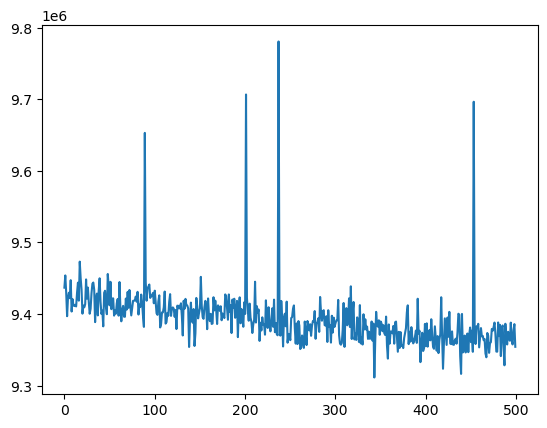

In [111]:
plt.plot(losses)

In [ ]:
def model_grads(model):
    model.sf.prior.kernel.sigma.requires_grad = False
    model.sf.prior.kernel.lengthscale.requires_grad = False
    model.sf.prior.kernel.group_diff_param.requires_grad = False
    model.sf.prior.Z.requires_grad=False
    model.sf.prior.mu.requires_grad=True
    model.sf.prior.Lu.requires_grad=True
    model.sf.W.requires_grad=True

    model.cf.prior.mean.requires_grad=False
    model.cf.prior.scale.requires_grad=True
    model.cf.W.requires_grad=False

    model.cf.prior.scale_pf = 0.5
    
    
    model.V.requires_grad=False

In [ ]:
model_grads(model)

In [ ]:
steps = 6000*3
model_grads(model)
model.to(device)
losses, means, scales, idxs = train_precomputed(model, optimizer, W, Y_train, device, steps=steps, E=3, batch_size=7000)

In [ ]:
# with torch.no_grad():
    # model.sf.prior.mu[5].view(-1)[:] = torch.randn(len(model.sf.prior.mu[4]))
    # model.cf.W.view(-1)[::1]=-7

In [112]:
torch.save(model.state_dict(), 'slideseq_mggp_nsf_3000_v2.pth')

In [77]:
# with torch.no_grad():
#     model.sf.prior.kernel.group_diff_param.view(-1)[:] = 0.5
# with torch.no_grad():
#     model.sf.prior.kernel.lengthscale.view(-1)[:] = 2.5

In [78]:
torch.round(model.sf.prior.kernel.group_diff_param, decimals=2)

tensor([100., 100., 100., 100., 100., 100., 100., 100., 100., 100., 100., 100.])

In [79]:
model.sf.prior.kernel.lengthscale

Parameter containing:
tensor([2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.])

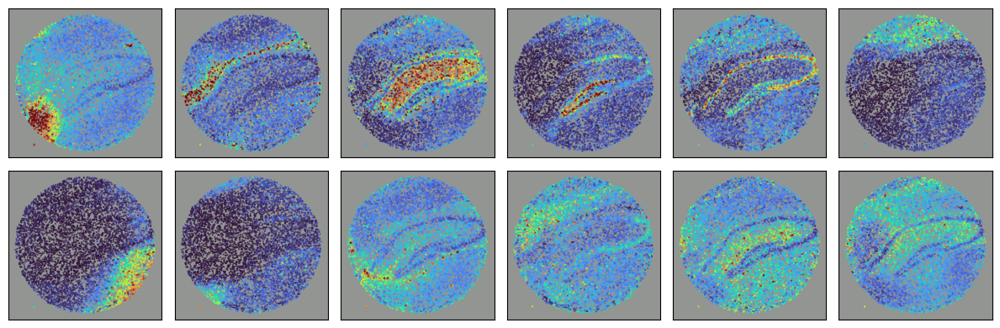

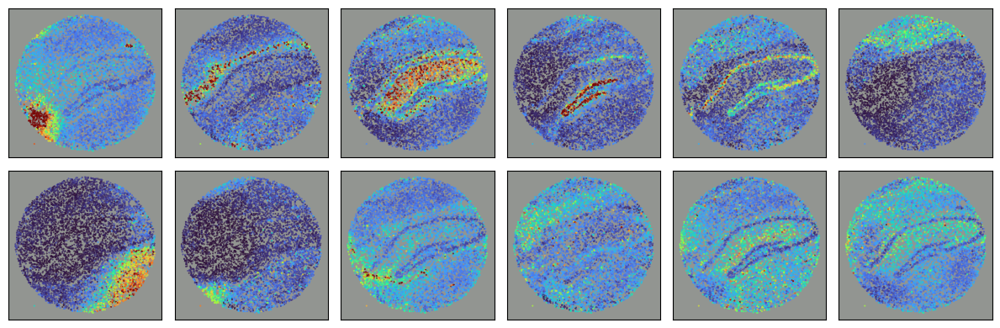

In [113]:
plot_factors(means[0], X[idxs[0]], moran_idx=None, ax=None, size=2, s=0.2, alpha=0.9)
plot_factors(means[-1], X[idxs[-1]], moran_idx=None, ax=None, size=2, s=0.2, alpha=0.9)

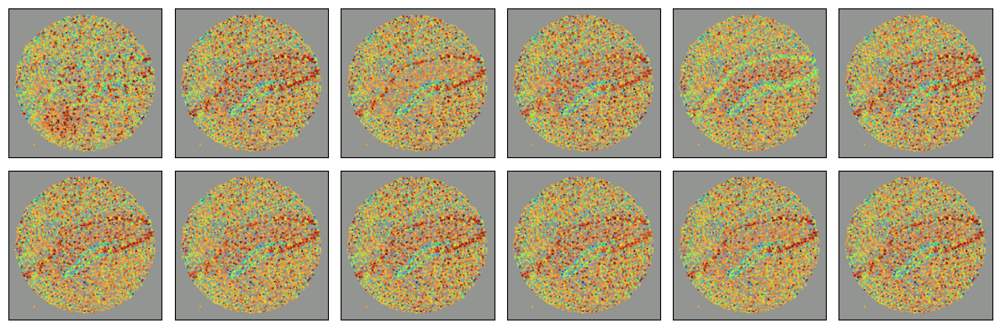

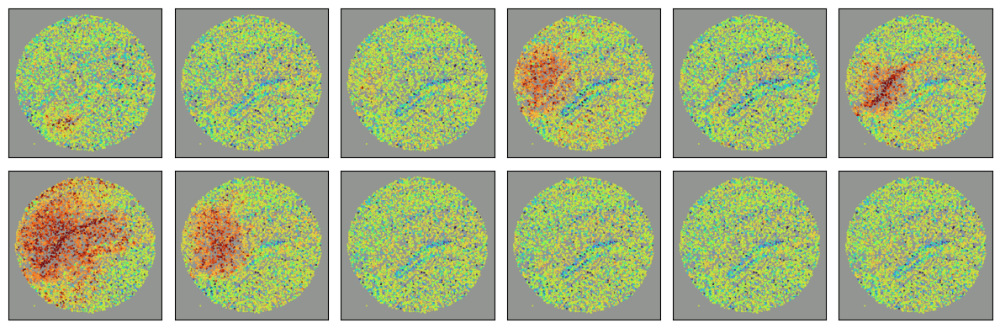

In [114]:
plot_factors(scales[0], X[idxs[0]], moran_idx=None, ax=None, size=2, s=0.2, alpha=0.9)
plot_factors(scales[-1], X[idxs[-1]], moran_idx=None, ax=None, size=2, s=0.2, alpha=0.9)

In [124]:
model.cpu()

qF2, _ = model.cf.prior()
mean2 = torch.exp(qF2.mean).detach().numpy()
scale2 = qF2.scale.detach().numpy()

In [125]:
moran_idx, moranI = dims_autocorr(mean2.T, X)
moranI

here_andata


array([ 8.88256797e-01,  7.52906674e-01,  6.49508859e-01,  6.19973129e-01,
        6.06612233e-01,  4.01943886e-01,  3.59560651e-01,  2.02179664e-01,
        1.62912327e-01,  1.56560238e-02, -2.81650645e-04, -4.19969630e-04])

In [126]:
mean2_ordered = mean2[moran_idx]

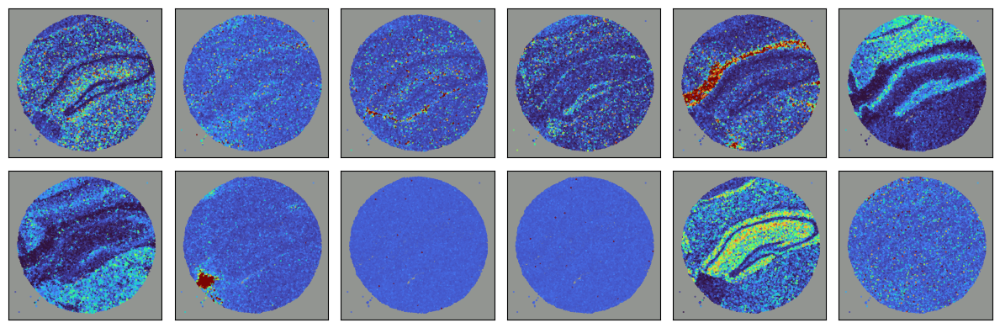

In [127]:
plot_factors(mean2, X, moran_idx=None, ax=None, size=2, s=0.2, alpha=0.9)


In [ ]:
model.sf.prior.kernel.group_diff_param

In [ ]:
plot_factors(scale2, X, moran_idx=None, ax=None, size=2, s=0.2, alpha=0.9)


In [134]:
loadings = torch.nn.functional.softplus(model.sf.W)
loadings_softmax = torch.nn.functional.softmax(loadings, dim=1)

In [142]:
order = torch.argsort(loadings_softmax,dim=0, descending=True)

In [174]:
Y_top = Y[order[:5]]

In [185]:
Y_top.shape

torch.Size([5, 12, 39694])

In [200]:
loadings_softmax = torch.nn.functional.softmax(loadings, dim=0)

In [202]:
loadings_softmax.sum(dim=0)

tensor([1.0001, 0.9999, 1.0001, 0.9999, 1.0001, 1.0000, 0.9999, 1.0000, 0.9999,
        0.9999, 0.9999, 1.0001], grad_fn=<SumBackward1>)

In [222]:
adata.var[adata.var.index=='Lrrtm4']

,MT,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,highly_variable,highly_variable_rank,means,variances,variances_norm,mt
Lrrtm4,False,2108,0.026092,0.025757,94.955248,1090.264404,6.995092,2108,True,8.0,0.119131,0.854205,4.990866,False


In [234]:
full_factors = np.concatenate((mean, mean2))
full_loadings = torch.concatenate((torch.nn.functional.softplus(model.sf.W), (torch.nn.functional.softplus(model.cf.W))), dim=1)


In [250]:
def plot_top_genes(factors, loadings, X, y, num_genes= 5, size=2, alpha=0.8, s=0.1, names=None):

    max_val_factors = np.percentile(factors, 99)
    min_val_factors = np.percentile(factors, 1)

    L = len(factors)//2


    loadings_softmax = torch.nn.functional.softmax(loadings, dim=1)

    order = torch.argsort(loadings_softmax,dim=0, descending=True)

    y_top = y[order[:num_genes]]
    fig, ax = plt.subplots(L, num_genes+1, figsize=(size*(num_genes+1), size*L), tight_layout=True)

    for i in range(L):
        

        curr_ax = ax[i, 0]
        curr_ax.scatter(X[:, 0], X[:,1], c=factors[i], vmin=min_val_factors, vmax=max_val_factors, alpha=alpha, cmap='turbo', s=s)
        curr_ax.invert_yaxis()
        curr_ax.set_xticks([])
        curr_ax.set_yticks([])
        curr_ax.set_facecolor('xkcd:gray')

        names = adata.var.index[order[:num_genes, i]]


        for j in range(num_genes):
            
            curr_ax = ax[i, j+1]
            curr_ax.scatter(X[:, 0], X[:,1], c=y_top[j, i], alpha=alpha, cmap='turbo', s=s)
            curr_ax.invert_yaxis()
            curr_ax.set_xticks([])
            curr_ax.set_yticks([])
            curr_ax.set_facecolor('xkcd:gray')

            title_text = curr_ax.set_title(names[j], x=0.03, y=.88, fontsize="medium", c="white",
                         ha="left", va="top")

            title_text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='black'),
                                 path_effects.Normal()])
        

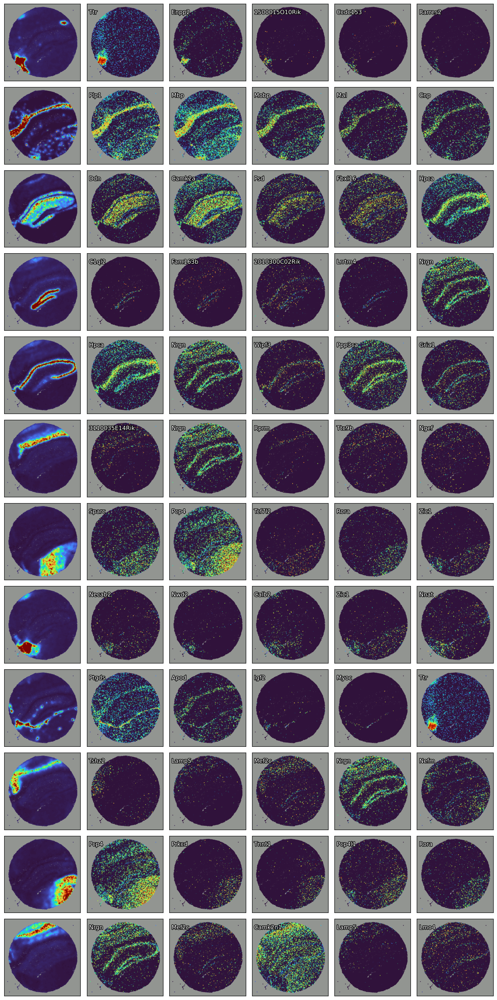

In [251]:
plot_top_genes(full_factors, full_loadings, X, Y, size=2, alpha=0.9, s=0.2, num_genes=5)

In [246]:
model.sf.prior.kernel.group_diff_param

Parameter containing:
tensor([2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.])

In [76]:
# with torch.no_grad():
#     model.cf.prior.mean[4].view(-1)[:] = torch.randn(len(model.cf.prior.mean[4].view(-1)))
#     model.cf.W[:,4].view(-1)[:] = -10

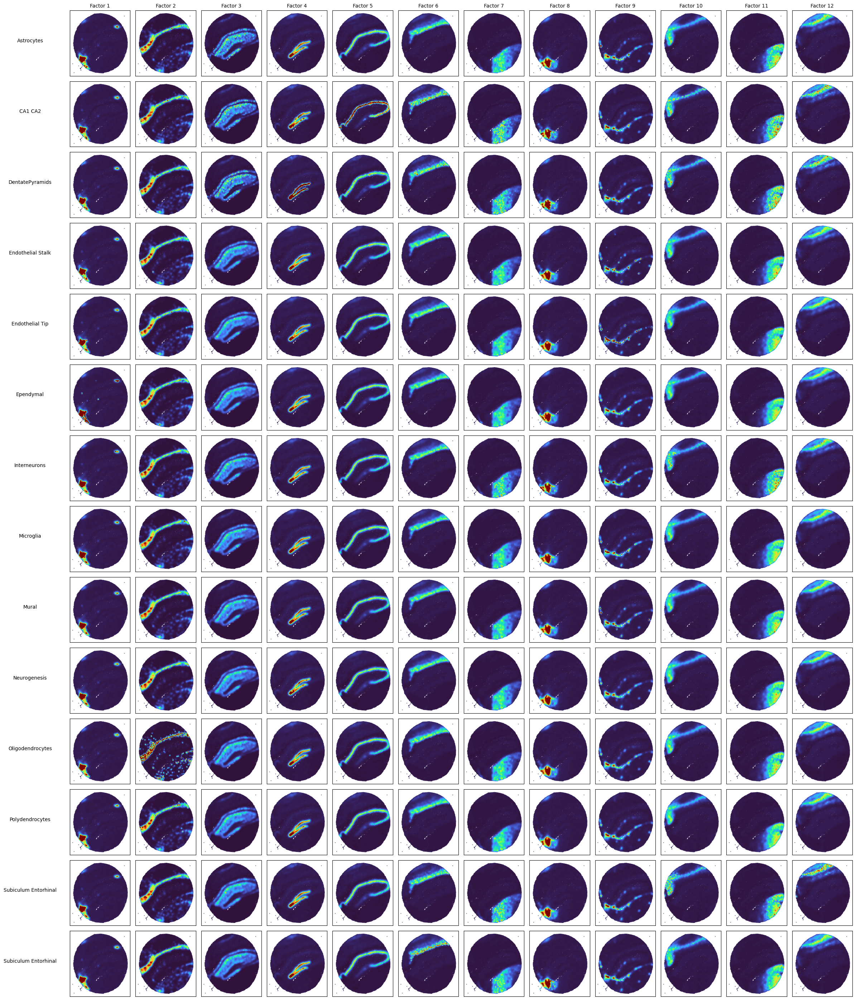

In [247]:
model.cpu()


L = 12
cols = ['Factor {}'.format(col) for col in range(1, L+1)]
rows = adata.obs.cluster.values.categories.to_list()





X_test = torch.tensor(rescale_spatial_coords(adata.obsm['spatial'])).type(torch.float)*50


max_val = np.percentile(mean, 99)
min_val = np.percentile(mean, 1)

size = 2
fig, axes = plt.subplots(nrows=n_groups, ncols=L, figsize=(size*L, size*(n_groups)))


for group_index in range(len(rows)):
    
    groupsX_test = torch.ones_like(torch.tensor(adata.obs.cluster.values.codes).type(torch.LongTensor)) * group_index
    qF1, qU, pU = model.sf.prior(X_test, groupsX=groupsX_test)
    factors1 = torch.exp(qF1.mean).detach().cpu().numpy()
    




    for i in range(L):

#         plt.subplot(n_groups, L, (group_index*L)+i+1)
        axes[group_index, i].scatter(X_test[:, 0], X_test[:,1], c=factors1[i], vmin=min_val, vmax=max_val, alpha=0.9, s=0.2, cmap='turbo')

        axes[group_index, i].invert_yaxis()
        axes[group_index, i].set(xticks=[], yticks=[])
        
        


for ax, col in zip(axes[0], cols):
    ax.set_title(col, fontsize=10)

for ax, row in zip(axes[:,0], rows):
    
    row = ' '.join(row.split('_')[:2])
    
    ax.set_ylabel(row, rotation=0, fontsize=10, labelpad=80)

fig.tight_layout()
plt.show()

In [ ]:
# size=2
# fig, ax = plt.subplots(2, 5, figsize=(size*5, size*2), tight_layout=True)


# def update(iteration):
#     for element in ax:
#         for element in element:
#             element.cla()
        
#     curr_factor = means[iteration]

    
    
#     plot_factors(curr_factor, X, ax=ax, size=2, s=0.6, alpha=1)

# #     fig.suptitle(f"Iteration: {iteration}, Loss: {losses[iteration*10]:0.2f}")
# #     fig.tight_layout()
#     print('hi', iteration)


# anim = FuncAnimation(fig, update, frames=np.arange(0, 600, 1), interval=100)
# plt.close()z
# # anim.save('pnmf.mp4',
# #          writer=animation.FFMpegWriter(fps=50, bitrate=2000, codec='h264'),
# #          dpi=50)
# anim.save("visium_vnngp.mp4", fps=60, dpi=100)